Bin2Cell Cell Expansion 

In [7]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
from scipy.sparse import load_npz, issparse
from skimage import io, measure
from skimage.segmentation import find_boundaries
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import colors, cm
%matplotlib inline
import anndata as ad

In [2]:
class B2CContext:
    """
    Wraps: H&E image (RGB), StarDist label image (sparse .npz of ints), and AnnData.
    Provides pixel-aligned centroids and object_id vector (if you still want it).
    """
    def __init__(self, he_image_path, labels_npz_path, adata_path):
        self.adata  = sc.read_h5ad(adata_path)
        self.he     = io.imread(he_image_path)
        self.lab_sp = load_npz(labels_npz_path)  # sparse int labels

        H, W = self.lab_sp.shape
        assert self.he.shape[:2] == (H, W), f"Image/labels mismatch: H&E {self.he.shape[:2]} vs {H,W}"

        # Prefer cropped pixel coords if present, else raw spatial
        if "spatial_cropped_150_buffer" in self.adata.obsm:
            xy = self.adata.obsm["spatial_cropped_150_buffer"]  # (x,y)
            source = "obsm['spatial_cropped_150_buffer']"
        elif "spatial" in self.adata.obsm:
            xy = self.adata.obsm["spatial"]
            source = "obsm['spatial']"
        else:
            raise KeyError("No pixel coords found in adata.obsm (need 'spatial' or 'spatial_cropped_150_buffer').")

        self.cols = np.rint(xy[:, 0]).astype(int)
        self.rows = np.rint(xy[:, 1]).astype(int)
        self.cols = np.clip(self.cols, 0, W-1)
        self.rows = np.clip(self.rows, 0, H-1)
        self.coord_source = source

        # Optional: object IDs if you want to compare methods
        self.obj_ids = self.adata.obs["object_id"].to_numpy().astype(int) if "object_id" in self.adata.obs else None

    @property
    def shape(self):
        return self.lab_sp.shape  # (H, W)

    def crop_rc(self, r0, r1, c0, c1):
        """Return H&E crop and DENSE label crop for [r0:r1, c0:c1]."""
        he  = self.he[r0:r1, c0:c1]
        lab = self.lab_sp[r0:r1, c0:c1].toarray()
        return he, lab


def make_tiles(ctx: B2CContext, tile_h=1500, tile_w=1500, stride_h=None, stride_w=None):
    H, W = ctx.shape
    stride_h = tile_h if stride_h is None else stride_h
    stride_w = tile_w if stride_w is None else stride_w
    tiles, tid = [], 0
    r = 0
    while r < H:
        r1 = min(r + tile_h, H)
        c = 0
        while c < W:
            c1 = min(c + tile_w, W)
            tiles.append(dict(id=tid, r0=r, r1=r1, c0=c, c1=c1))
            tid += 1
            if c1 == W: break
            c += stride_w
        if r1 == H: break
        r += stride_h
    return tiles


def show_tile_grid_numbers(ctx: B2CContext, tiles, downsample=8, fontsize=10):
    H, W = ctx.shape
    thumb = ctx.he[::downsample, ::downsample]
    fig, ax = plt.subplots(figsize=(10, 10 * H / W))
    ax.imshow(thumb)
    for t in tiles:
        r0, r1 = t["r0"] // downsample, t["r1"] // downsample
        c0, c1 = t["c0"] // downsample, t["c1"] // downsample
        ax.plot([c0, c1, c1, c0, c0], [r0, r0, r1, r1, r0], color="white", linewidth=0.6)
        ax.text((c0 + c1) / 2, (r0 + r1) / 2, str(t["id"]), color="white",
                fontsize=fontsize, ha="center", va="center")
    ax.set_title(f"Tile grid (downsample={downsample}x). Slide size H×W = {H}×{W}\ncoords from {ctx.coord_source}")
    ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(); plt.show()


def tiles_to_table(tiles, csv_path=None):
    df = pd.DataFrame(tiles)[["id", "r0", "r1", "c0", "c1"]].sort_values("id").reset_index(drop=True)
    if csv_path: df.to_csv(csv_path, index=False)
    return df


# Gene utilities
def dense_gene(adata, gene):
    if gene not in adata.var_names:
        raise ValueError(f"{gene} not in adata.var_names.")
    Xg = adata[:, gene].X
    if issparse(Xg):
        Xg = Xg.toarray()
    return np.asarray(Xg).ravel()

# Rendering (tile-based)
def draw_all_boundaries(ctx: B2CContext, tile, edge_thickness=1):
    r0, r1, c0, c1 = tile["r0"], tile["r1"], tile["c0"], tile["c1"]
    he, lab = ctx.crop_rc(r0, r1, c0, c1)
    from scipy.ndimage import binary_dilation

    edges = find_boundaries(lab, mode="inner")
    if edge_thickness > 1:
        edges = binary_dilation(edges, iterations=edge_thickness-1)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(he)
    ax.imshow(edges, alpha=0.9)
    ax.set_title(f"Tile {tile['id']} — all nuclei boundaries")
    ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(); plt.show()


def tile_gene_centroid_map(ctx: B2CContext, tile, gene,
                           expr_quantile=0.95, top_n=None,
                           mode="outline",  # outline or fill
                           search_radius=1,  # small neighborhood to catch centroid on 0
                           cmap_name="viridis",
                           outline_width=1.2,
                           make_barplot=True):
    """
    Tile-only pipeline:
      1) crop H&E and label tile
      2) filter cells in tile and by expression quantile
      3) map each kept cell to the label under its centroid (with small neighborhood search)
      4) aggregate per-label expression (max per label)
      5) render overlay + optional ranked bar plot
    """
    r0, r1, c0, c1 = tile["r0"], tile["r1"], tile["c0"], tile["c1"]
    he, lab = ctx.crop_rc(r0, r1, c0, c1)
    present = np.unique(lab); present = present[present > 0]
    if present.size == 0:
        raise RuntimeError("No labels in this tile.")

    Xg = dense_gene(ctx.adata, gene)

    # in-tile cells by centroid
    in_tile = (ctx.rows >= r0) & (ctx.rows < r1) & (ctx.cols >= c0) & (ctx.cols < c1)
    if not np.any(in_tile):
        raise RuntimeError("No cells (centroids) in this tile region.")

    # expression filter
    keep = in_tile.copy()
    if expr_quantile is not None:
        thr = np.quantile(Xg[in_tile], expr_quantile)
        keep &= (Xg > thr)

    rows_k = ctx.rows[keep] - r0
    cols_k = ctx.cols[keep] - c0
    vals_k = Xg[keep]

    # map centroid = label with a tiny local search if the exact pixel is background
    def nearest_label(rr, cc):
        lbl = lab[rr, cc]
        if lbl > 0 or search_radius <= 0:
            return lbl
        rr0 = max(rr - search_radius, 0); rr1 = min(rr + search_radius + 1, lab.shape[0])
        cc0 = max(cc - search_radius, 0); cc1 = min(cc + search_radius + 1, lab.shape[1])
        sub = lab[rr0:rr1, cc0:cc1]
        nz = sub[sub > 0]
        if nz.size == 0:
            return 0
        return np.bincount(nz).argmax()

    # aggregate per-label (max expression)
    lab_expr = {}
    for rr, cc, v in zip(rows_k, cols_k, vals_k):
        if rr < 0 or cc < 0 or rr >= lab.shape[0] or cc >= lab.shape[1]:
            continue
        lbl = nearest_label(rr, cc)
        if lbl <= 0:
            continue
        if (lbl not in lab_expr) or (v > lab_expr[lbl]):
            lab_expr[lbl] = v

    if not lab_expr:
        raise RuntimeError("No labels passed the filter in this tile (after centroid→label mapping).")

    # Rank labels by expression and pick top_n if requested
    ranked = np.array(sorted(lab_expr, key=lab_expr.get, reverse=True), dtype=int)
    if top_n is not None:
        ranked = ranked[:top_n]
    vals = np.array([lab_expr[l] for l in ranked], dtype=float)

    #  color scale
    vmin, vmax = (np.percentile(vals, 2), np.percentile(vals, 98)) if vals.size > 5 else (vals.min(), vals.max())
    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)

    # overlay render 
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(he)

    if mode == "fill":
        lut = np.full(int(lab.max()) + 1, np.nan, dtype=float)
        for lbl in ranked: lut[lbl] = lab_expr[lbl]
        expr_img = lut[lab]
        im = ax.imshow(expr_img, cmap=cmap, norm=norm, alpha=0.45)
        cb = plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02); cb.set_label(f"{gene} (max per label)")
    elif mode == "outline":
        lines, line_colors = [], []
        for lbl in ranked:
            rr, cc = np.where(lab == lbl)
            if rr.size == 0: continue
            rmin, rmax = rr.min(), rr.max() + 1
            cmin, cmax = cc.min(), cc.max() + 1
            roi = (lab[rmin:rmax, cmin:cmax] == lbl)
            for c in measure.find_contours(roi, 0.5):
                c[:, 0] += rmin; c[:, 1] += cmin
                lines.append(np.column_stack((c[:, 1], c[:, 0])))
                line_colors.append(cmap(norm(lab_expr[lbl])))
        if lines:
            ax.add_collection(LineCollection(lines, colors=line_colors, linewidths=outline_width))
        sm = cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
        cb = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02); cb.set_label(f"{gene} (max per label)")
    else:
        raise ValueError("mode must be 'outline' or 'fill'.")

    # plot centroids kept 
    ax.scatter(cols_k, rows_k, s=6, facecolors='none', edgecolors='cyan', linewidths=0.6)

    ax.set_title(f"Tile {tile['id']} — {gene} ({len(ranked)} labels shown; q={expr_quantile})")
    ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(); plt.show()

    if make_barplot:
        fig2, ax2 = plt.subplots(figsize=(6, max(2, 0.2*len(ranked))))
        order = np.argsort(vals)[::-1]
        ax2.barh([str(ranked[i]) for i in order], vals[order])
        ax2.invert_yaxis()
        ax2.set_xlabel(f"{gene} (max per label)")
        ax2.set_ylabel("Label (StarDist ID)")
        ax2.set_title(f"Tile {tile['id']} — ranked labels by {gene}")
        plt.tight_layout(); plt.show()

    # return a small table if you want to export
    df = pd.DataFrame({"label": ranked, f"{gene}_max": vals})
    return df


def overlay_tile_quick(ctx, tiles, tile_id, gene, expr_q=0.95, top_n=500, mode="outline"):
    tile = next(t for t in tiles if t["id"] == tile_id)
    draw_all_boundaries(ctx, tile, edge_thickness=2)
    return tile_gene_centroid_map(ctx, tile, gene, expr_quantile=expr_q, top_n=top_n, mode=mode)


In [5]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from skimage.segmentation import expand_labels, find_boundaries
from skimage import measure

from matplotlib.collections import LineCollection
from matplotlib import colors, cm
def expand_labels_b2c_tile(
    ctx, tile,
    mode="fixed",           # fixed or volume_ratio
    max_bin_distance=2,     # in Visium-HD bins
    mpp=0.3,                # microns per pixel (your H&E/labels)
    bin_um=2.0,             # microns per Visium-HD bin
    volume_ratio=4.0,       # only used if mode="volume_ratio"
    pad_factor=2,            # padding to avoid edge clipping during expansion
    custom_title = None):
    """
    Expand nuclei labels like Bin2Cell around each nucleus, but only inside the tile.
    Steps:
      - compute a pixel expansion radius (dist_px)
      - pad the tile window by ~2× that radius
      - expand labels on the padded crop
      - crop back to the original tile window
    Returns:
      he_crop (H,W,3), lab_exp (H,W) expanded labels, dist_px (int)
    """
    # --- compute expansion distance in pixels ---
    dist_px_fixed = int(np.ceil(max(1.0, max_bin_distance * (bin_um / mpp))))

    if mode == "volume_ratio":
        # Estimate a single global delta radius that roughly gives the requested area multiple.
        r0, r1, c0, c1 = tile["r0"], tile["r1"], tile["c0"], tile["c1"]
        _, lab_raw = ctx.crop_rc(r0, r1, c0, c1)  # dense in-tile raw labels
        lab_ids, counts = np.unique(lab_raw[lab_raw > 0], return_counts=True)
        if lab_ids.size > 0:
            r_eff = np.sqrt(counts / np.pi)  # radius equivalent from area
            delta_r = (np.sqrt(volume_ratio) - 1.0) * r_eff
            dist_px = int(np.clip(np.median(delta_r), 1, 5 * dist_px_fixed))
        else:
            dist_px = dist_px_fixed
    else:
        dist_px = dist_px_fixed

    #  pad the tile to avoid edge truncation 
    H, W = ctx.shape
    r0, r1, c0, c1 = tile["r0"], tile["r1"], tile["c0"], tile["c1"]
    pad = pad_factor * dist_px

    rp0 = max(r0 - pad, 0); rp1 = min(r1 + pad, H)
    cp0 = max(c0 - pad, 0); cp1 = min(c1 + pad, W)

    #  get padded crops 
    he_pad  = ctx.he[rp0:rp1, cp0:cp1]
    lab_pad = ctx.lab_sp[rp0:rp1, cp0:cp1].toarray()

    #  expand on padded labels 
    lab_exp_pad = expand_labels(lab_pad, distance=dist_px)

    # crop back to the original tile 
    r0_rel = r0 - rp0; r1_rel = r1 - rp0
    c0_rel = c0 - cp0; c1_rel = c1 - cp0

    he_crop = he_pad[r0_rel:r1_rel, c0_rel:c1_rel]
    lab_exp = lab_exp_pad[r0_rel:r1_rel, c0_rel:c1_rel]

    return he_crop, lab_exp, dist_px


In [2]:
ctx = B2CContext(
    he_image_path   = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P2_CRC/stardist/he.tiff",
    labels_npz_path = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P2_CRC/stardist/he.npz",
    adata_path      = "/gpfs/commons/groups/innovation/share/10X_VisiumHD_CRC/adata/annotated_b2c_adatas/P2_CRC_annotated.h5ad",
)
print("Slide shape (H,W):", ctx.shape, "| coords:", ctx.coord_source)

tiles = make_tiles(ctx, tile_h=1500, tile_w=1500, stride_h=1500, stride_w=1500)
show_tile_grid_numbers(ctx, tiles, downsample=8, fontsize=10)

NameError: name 'B2CContext' is not defined

In [8]:
adata_path = ad.read_h5ad("/gpfs/commons/groups/innovation/share/10X_VisiumHD_CRC/adata/annotated_b2c_adatas/P2_CRC_annotated.h5ad")

In [18]:
adata_path[:,['HES4', 'ISG15']]

View of AnnData object with n_obs × n_vars = 240708 × 2
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'source', 'predicted_ClusterFull', 'predicted_ClusterTop', 'predicted_ClusterMidway'
    uns: 'neighbors', 'pca', 'predicted_ClusterFull_colors', 'predicted_ClusterMidway_colors', 'predicted_ClusterTop_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial', 'spatial_cropped_150_buffer'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [38]:
"HES4" in adata_path.var_names

False

In [39]:
gene_list=["HES4"]
id_list=[]
for i,g in enumerate(gene_list):
    for adg in adata_path.var_names:
        if g in adg:
            id_list.append(i)
id_list            


[0]

In [41]:
df=adata_path.obs
for i,g in zip(id_list,gene_list):
    df[g]=adata_path.X[:,i]
df.sample(20)

,object_id,bin_count,array_row,array_col,labels_joint_source,source,predicted_ClusterFull,predicted_ClusterTop,predicted_ClusterMidway,HES4
151838,151838.0,49.0,1390.877551,2040.612245,primary,query,Tumor cE02 (Stem/TA-like/Immature Goblet),Epi,EpiT,6.715782
156299,156299.0,20.0,1008.850000,2536.400000,primary,query,cE04 (Enterocyte 1),Epi,Epi,-0.095397
115954,115954.0,16.0,1695.625000,2958.500000,primary,query,Tumor cE03 (Stem/TA-like prolif),Epi,EpiT,-0.095397
234571,234571.0,16.0,0.937500,2014.812500,primary,query,cS25 (Fibro CCL8+),Strom,Fibro,-0.095397
228750,228750.0,32.0,141.843750,2285.656250,primary,query,cP1 (Plasma IgA),Plasma,Plasma,-0.095397
107039,107039.0,35.0,1973.085714,2248.914286,primary,query,Tumor cE01 (Stem/TA-like),Epi,EpiT,-0.095397
117687,117687.0,45.0,1785.666667,3064.866667,primary,query,Tumor cE01 (Stem/TA-like),Epi,EpiT,-0.095397
121917,121917.0,27.0,1038.037037,404.407407,primary,query,cTNI14 (CD8+ CXCL13+),TNKILC,TCD8,-0.095397
213914,213914.0,15.0,959.466667,3074.400000,primary,query,Tumor cE01 (Stem/TA-like),Epi,EpiT,-0.095397
78620,78620.0,27.0,1934.481481,81.074074,primary,query,Tumor cE01 (Stem/TA-like),Epi,EpiT,-0.095397


In [46]:
gene_list = df.to_csv("/gpfs/commons/groups/innovation/jjoseph/Sep_2025/example_gene.csv")

In [7]:
def tile_gene_b2c_expand(ctx, tile, gene,
                         color_mode="gradient",      # gradient or binary
                         expr_quantile=None,         # None => keep all labels with any mapped cells
                         top_n=None,
                         render_mode="outline",      # outline or fill for the gene layer
                         # expansion params
                         b2c_mode="fixed",           # "fixed" or "volume_ratio"
                         max_bin_distance=2,
                         mpp=0.3,
                         bin_um=2.0,
                         volume_ratio=4.0,
                         all_expanded_outline=True,  # this was all_cell_outline before # keep tracj
                         expanded_edges_color="lightgray",
                         expanded_edges_alpha=0.7,
                         expanded_edges_width=0.6,
                         all_nuclei_outline=False,   
                         nuclei_edges_color="lightgray",
                         nuclei_edges_alpha=0.7,
                         nuclei_edges_width=0.6,
                         # binary style
                         highlight_color="lime",
                         highlight_width=2.5,
                         # gradient style
                         cmap_name="viridis",
                         vmin=None, vmax=None,
                         custom_title = None,
                         show_centroids=False):
    """
    H&E + optional ALL *nuclei* outlines (raw labels) +
    optional ALL expanded cell boundaries (Bin2Cell-style) +
    gene-positive expanded cells highlighted (gradient/binary × outline/fill).
    """
    # Expand labels on a padded crop, then crop back to the tile
    he, lab_exp, dist_px = expand_labels_b2c_tile(
        ctx, tile, mode=b2c_mode, max_bin_distance=max_bin_distance,
        mpp=mpp, bin_um=bin_um, volume_ratio=volume_ratio
    )

    #  Also get the raw (non-expanded) label crop for optional nuclei outlines
    r0,r1,c0,c1 = tile["r0"], tile["r1"], tile["c0"], tile["c1"]
    _, lab_raw = ctx.crop_rc(r0, r1, c0, c1)  # dense label crop (original nuclei labels)
    present = np.unique(lab_exp); present = present[present > 0]
    if present.size == 0:
        raise RuntimeError("No expanded labels in this tile.")

    # Dense gene vector + centroids-in-tile + optional quantile filter
    from scipy.sparse import issparse
    if gene not in ctx.adata.var_names:
        raise ValueError(f"{gene} not in adata.var_names.")
    Xg = ctx.adata[:, gene].X
    if issparse(Xg): Xg = Xg.toarray()
    Xg = np.asarray(Xg).ravel()

    in_tile = (ctx.rows >= r0) & (ctx.rows < r1) & (ctx.cols >= c0) & (ctx.cols < c1)
    if not np.any(in_tile):
        raise RuntimeError("No centroids in this tile.")

    thr = None
    keep = in_tile.copy()
    if expr_quantile is not None:
        thr = np.quantile(Xg[in_tile], expr_quantile)
        keep &= (Xg > thr)

    rows_k = ctx.rows[keep] - r0
    cols_k = ctx.cols[keep] - c0
    vals_k = Xg[keep]

    # Map centroid = EXPANDED label and aggregate per-label expression (max)
    lab_expr = {}
    Ht, Wt = lab_exp.shape
    for rr, cc, v in zip(rows_k, cols_k, vals_k):
        if 0 <= rr < Ht and 0 <= cc < Wt:
            lbl = lab_exp[rr, cc]
            if lbl > 0 and ((lbl not in lab_expr) or (v > lab_expr[lbl])):
                lab_expr[lbl] = v

    keep_labels = np.array(sorted(lab_expr.keys()), dtype=int)
    if keep_labels.size == 0:
        fig, ax = plt.subplots(figsize=(8,8))
        ax.imshow(he, zorder=0)
        ax.set_title(f"Tile {tile['id']} — {gene}: 0 expanded labels pass"
                     + (f" (q={expr_quantile:.2f}, thr≈{thr:.3g})" if thr is not None else ""))
        ax.set_xticks([]); ax.set_yticks([])
        plt.tight_layout(); plt.show()
        return

    if top_n is not None and keep_labels.size > top_n:
        keep_labels = np.array(sorted(keep_labels, key=lambda l: lab_expr[l], reverse=True)[:top_n], dtype=int)

    # for gradient scale 
    if color_mode == "gradient":
        vals = np.array([lab_expr[l] for l in keep_labels], dtype=float)
        if vmin is None or vmax is None:
            if vals.size > 5:
                vmin, vmax = np.percentile(vals, [2, 98])
            else:
                vmin, vmax = float(vals.min()), float(vals.max())
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        cmap = cm.get_cmap(cmap_name)

    # Render
    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(he, zorder=0)

    from skimage.segmentation import find_boundaries
    from skimage import measure

    # ALL nuclei (raw StarDist labels) outlines
    if all_nuclei_outline:
        edges_raw = find_boundaries(lab_raw, mode="inner")
        ax.contour(edges_raw, levels=[0.5],
                   colors=nuclei_edges_color,
                   linewidths=nuclei_edges_width,
                   alpha=nuclei_edges_alpha,
                   zorder=1)

    # ALL expanded cell outlines
    if all_expanded_outline:
        edges_exp = find_boundaries(lab_exp, mode="inner")
        ax.contour(edges_exp, levels=[0.5],
                   colors=expanded_edges_color,
                   linewidths=expanded_edges_width,
                   alpha=expanded_edges_alpha,
                   zorder=2)

    # Gene overlay on expanded labels
    if render_mode == "fill":
        lut = np.full(int(lab_exp.max())+1, np.nan, dtype=float)
        for lbl in keep_labels:
            lut[lbl] = lab_expr[lbl]
        if color_mode == "binary":
            from matplotlib.colors import ListedColormap
            cm_bin = ListedColormap([(0,0,0,0), (0,1,0,1)])
            mask = ~np.isnan(lut[lab_exp])
            ax.imshow(mask.astype(float), cmap=cm_bin, alpha=0.4, zorder=3)
        else:
            im = ax.imshow(lut[lab_exp], cmap=cmap, norm=norm, alpha=0.5, zorder=3)
            cb = plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02)
            cb.set_label(f"{gene} (max per expanded label)")
    else:  # outline mode
        if color_mode == "binary":
            lines = []
            for lbl in keep_labels:
                rr, cc = np.where(lab_exp == lbl)
                if rr.size == 0: continue
                rmin, rmax = rr.min(), rr.max()+1
                cmin, cmax = cc.min(), cc.max()+1
                roi = (lab_exp[rmin:rmax, cmin:cmax] == lbl)
                for c in measure.find_contours(roi, 0.5):
                    c[:,0] += rmin; c[:,1] += cmin
                    lines.append(np.column_stack((c[:,1], c[:,0])))
            if lines:
                ax.add_collection(LineCollection(lines, colors=highlight_color,
                                                 linewidths=highlight_width, zorder=4))
        else:
            lines, line_colors = [], []
            for lbl in keep_labels:
                rr, cc = np.where(lab_exp == lbl)
                if rr.size == 0: continue
                rmin, rmax = rr.min(), rr.max()+1
                cmin, cmax = cc.min(), cc.max()+1
                roi = (lab_exp[rmin:rmax, cmin:cmax] == lbl)
                for c in measure.find_contours(roi, 0.5):
                    c[:,0] += rmin; c[:,1] += cmin
                    lines.append(np.column_stack((c[:,1], c[:,0])))
                    line_colors.append(cmap(norm(lab_expr[lbl])))
            if lines:
                ax.add_collection(LineCollection(lines, colors=line_colors,
                                                 linewidths=highlight_width, zorder=4))
            sm = cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
            cb = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
            cb.set_label(f"{gene} (max per expanded label)")

    if show_centroids:
        kset = set(keep_labels.tolist())
        rr_keep, cc_keep = [], []
        for rr, cc in zip(ctx.rows[in_tile]-r0, ctx.cols[in_tile]-c0):
            lbl = lab_exp[rr, cc]
            if lbl in kset:
                rr_keep.append(rr); cc_keep.append(cc)
        ax.scatter(cc_keep, rr_keep, s=8, facecolors='none', edgecolors='cyan', linewidths=0.6, zorder=5)

    # can make custom title
    if custom_title is not None:
        title_str = custom_title
    else:
        title_str = (
            f"Tile {tile['id']} — {gene} | expand={b2c_mode} "
            f"(max_bin_distance={max_bin_distance}, ~{dist_px}px) | color_mode={color_mode}"
            + (f" | q={expr_quantile:.2f}, thr≈{thr:.3g}" if expr_quantile is not None and thr is not None else "")
        )
    
    ax.set_title(title_str)
    ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_1407462/1780579210.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


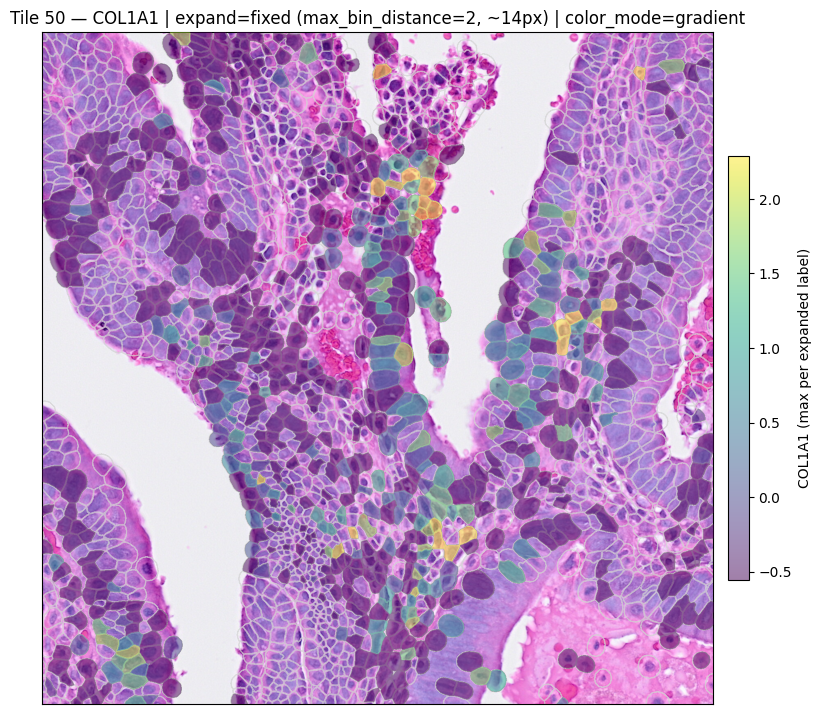

In [8]:
tiles = make_tiles(ctx, tile_h=1500, tile_w=1500)
tile = tiles[50]  

tile_gene_b2c_expand(
    ctx, tile, gene="COL1A1",
    color_mode="gradient",        # or binary
    expr_quantile=None,           # keep all with any mapped centroids
    render_mode="fill",        # or fill
    b2c_mode="fixed",             # fixed is the classic Bin2Cell max_bin_distance expansion
    max_bin_distance=2,           # try 2–4 like in the notebooks
    mpp=0.3,                      # match the mpp used to build the H&E/labels image
    bin_um=2.0,                   # Visium HD bin is ~2 µm
    show_centroids=False,
    all_nuclei_outline=False, # True or false outlines all nuclei

)


/tmp/ipykernel_1407462/1780579210.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


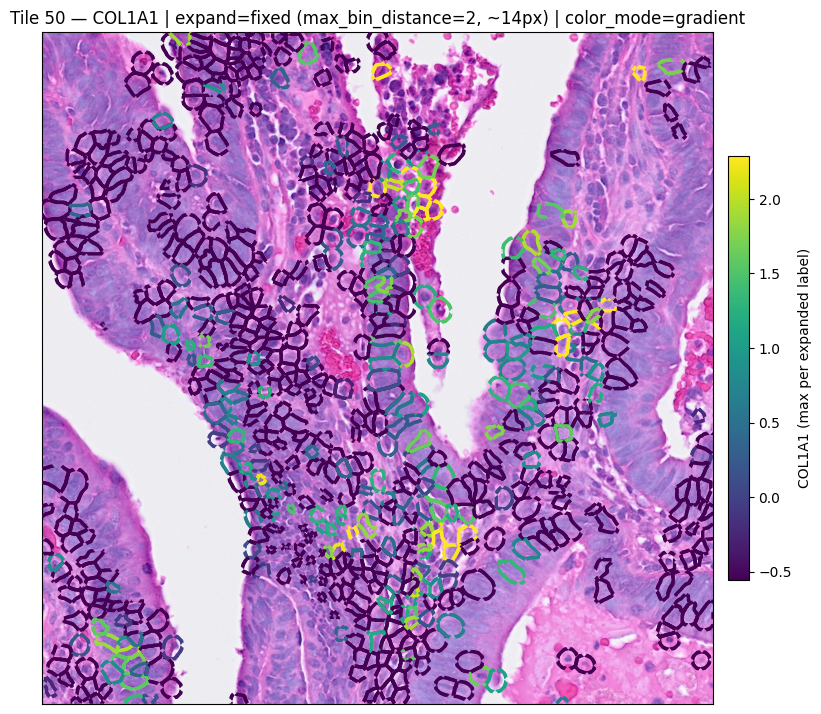

In [9]:
tile_gene_b2c_expand(ctx, tile, "COL1A1",
                     all_expanded_outline=False,
                     all_nuclei_outline=False)


/tmp/ipykernel_1407462/1780579210.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


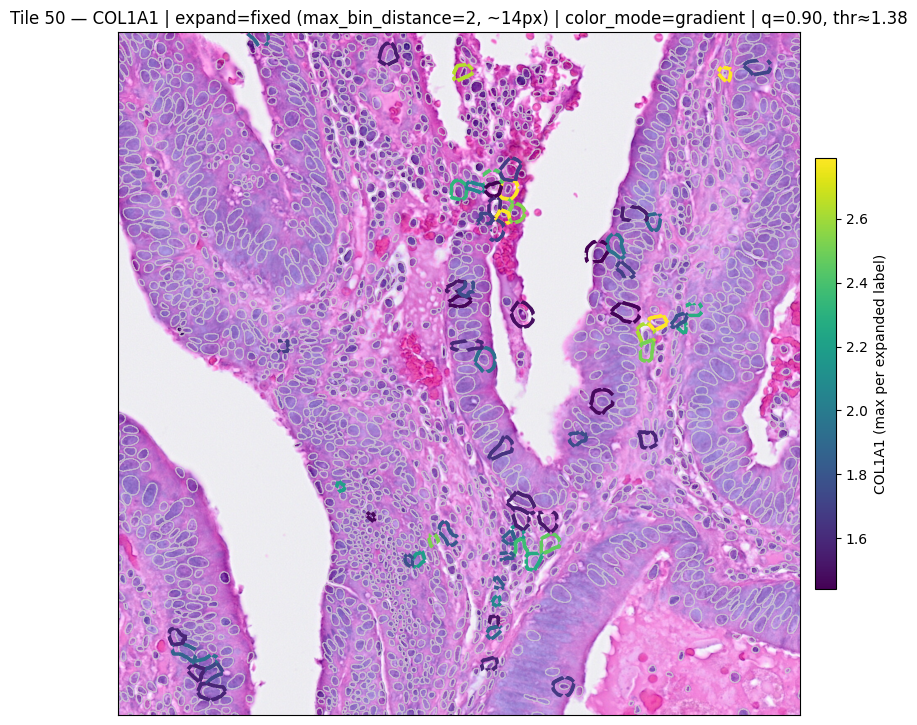

In [10]:
tile_gene_b2c_expand(
    ctx, tile, "COL1A1",
     expr_quantile=0.9,     
    top_n = 100,
    b2c_mode="fixed", max_bin_distance=2,
    color_mode="gradient", render_mode="outline",
    all_expanded_outline=False,            # gray mesh of expanded cells
    all_nuclei_outline=True,             # hide raw nuclei me
)

Slide shape (H,W): (21726, 22753) | coords: obsm['spatial_cropped_150_buffer']


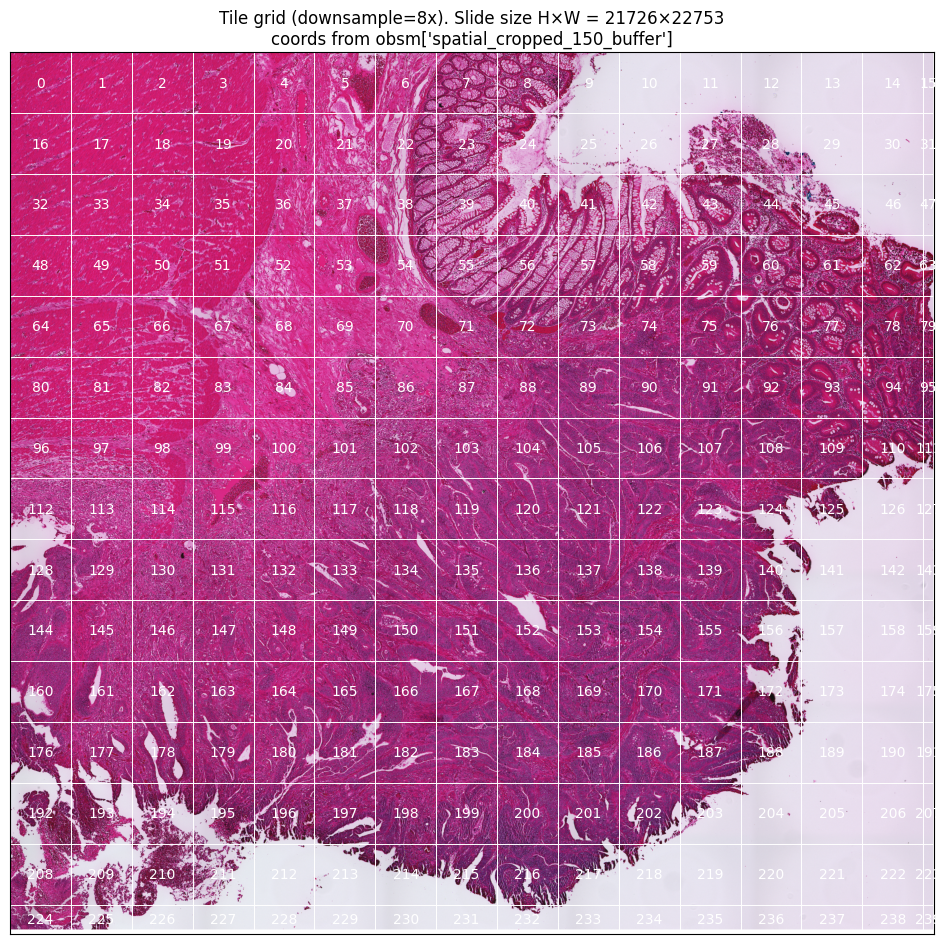

In [11]:
ctx = B2CContext(
    he_image_path   = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC5T/stardist/he.tiff",
    labels_npz_path = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC5T/stardist/he.npz",
    adata_path      = "/gpfs/commons/groups/innovation/share/10X_VisiumHD_CRC/adata/annotated_b2c_adatas/P2_CRC_annotated.h5ad",
)
print("Slide shape (H,W):", ctx.shape, "| coords:", ctx.coord_source)

tiles = make_tiles(ctx, tile_h=1500, tile_w=1500, stride_h=1500, stride_w=1500)
show_tile_grid_numbers(ctx, tiles, downsample=8, fontsize=10)

/tmp/ipykernel_1407462/1780579210.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


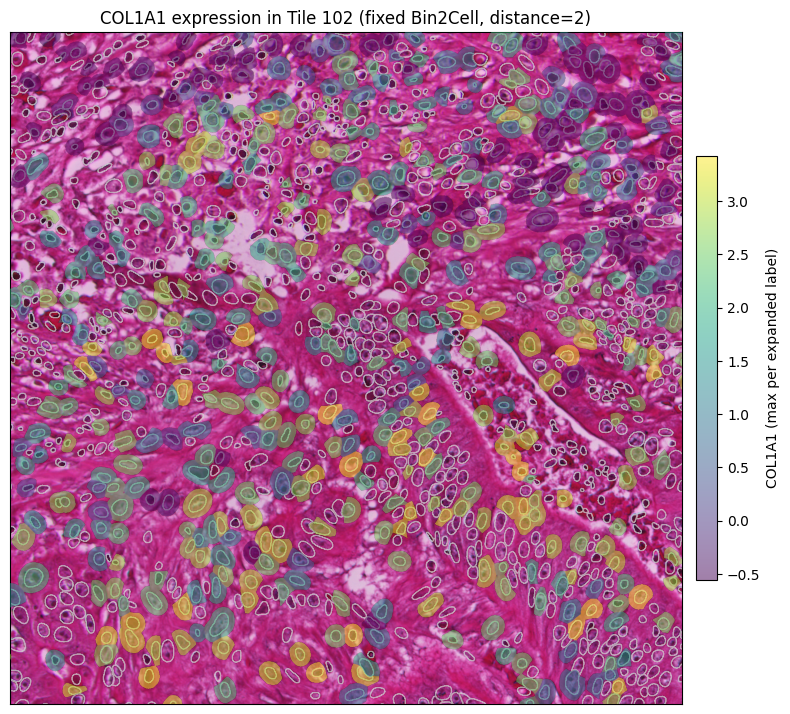

In [12]:
tiles = make_tiles(ctx, tile_h=1500, tile_w=1500)
tile = tiles[102]  

tile_gene_b2c_expand(
    ctx, tile, gene="COL1A1",
    custom_title="COL1A1 expression in Tile 102 (fixed Bin2Cell, distance=2)",
    color_mode="gradient",        # or binary
    expr_quantile=None,           # keep all with any mapped centroids
    render_mode="fill",        # or fill
    b2c_mode="fixed",             # fixed is the classic Bin2Cell max_bin_distance expansion
    max_bin_distance=2,           # try 2–4 like in the notebooks
    mpp=0.3,                      # match the mpp used to build the H&E/labels image
    bin_um=2.0,                   # Visium HD bin is ~2 µm
    show_centroids=False,
    all_nuclei_outline=True, # True or false outlines all nuclei
    all_expanded_outline=False,            # gray mesh of expanded cells


)


Slide shape (H,W): (22652, 22653) | coords: obsm['spatial_cropped_150_buffer']


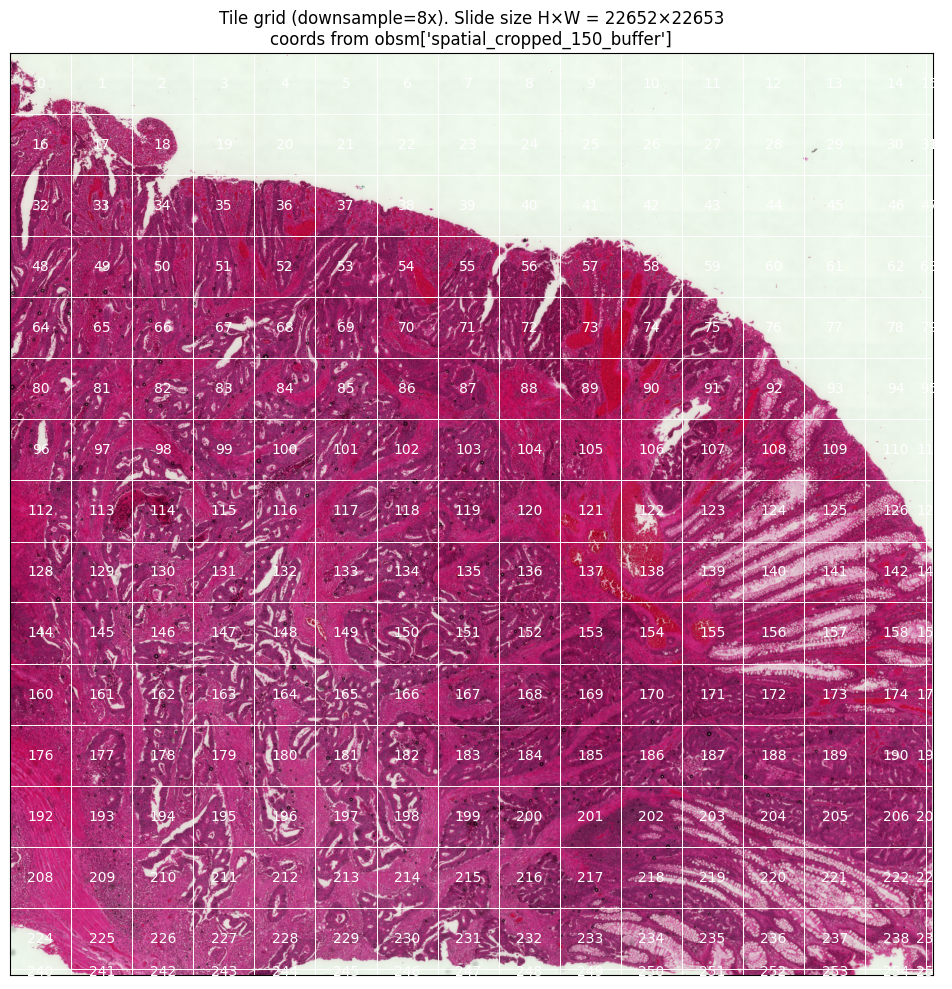

In [31]:
ctx = B2CContext(
    he_image_path   = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC46/stardist/he.tiff",
    labels_npz_path = "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC46/stardist/he.npz",
    adata_path      = "/gpfs/commons/groups/innovation/jjoseph/Sep_2025/adata/annotated_b2c_adatas/JGCRC46_annotated.h5ad",
)
print("Slide shape (H,W):", ctx.shape, "| coords:", ctx.coord_source)

tiles = make_tiles(ctx, tile_h=1500, tile_w=1500, stride_h=1500, stride_w=1500)
show_tile_grid_numbers(ctx, tiles, downsample=8, fontsize=10)

/tmp/ipykernel_1407462/1780579210.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


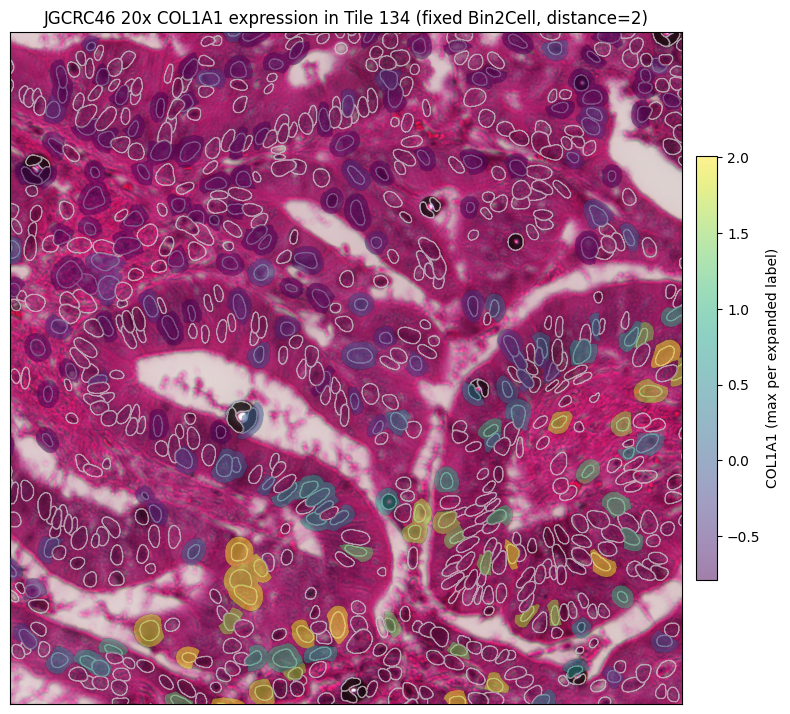

In [50]:
tiles = make_tiles(ctx, tile_h=1500, tile_w=1500)
tile = tiles[150]  

tile_gene_b2c_expand(
    ctx, tile, gene="COL1A1",
    custom_title="JGCRC46 20x COL1A1 expression in Tile 134 (fixed Bin2Cell, distance=2)",
    color_mode="gradient",        # or binary
    expr_quantile=None,           # keep all with any mapped centroids
    render_mode="fill",        # or fill
    b2c_mode="fixed",             # fixed is the classic Bin2Cell max_bin_distance expansion
    max_bin_distance=2,           # try 2–4 like in the notebooks
    mpp=0.3,                      # match the mpp used to build the H&E/labels image
    bin_um=2.0,                   # Visium HD bin is ~2 µm
    show_centroids=False,
    all_nuclei_outline=True, # True or false outlines all nuclei
    all_expanded_outline=False,            # gray mesh of expanded cells


)
